In [1]:
import os

import numpy as np
import pandas as pd
import torch
from pathlib import Path
import matplotlib.pyplot as plt
from PIL import Image

In [2]:
DATASET_PATH = Path("/share/datasets/wikihow-vgsi")
METADATA_PATH = DATASET_PATH / "WikihowText_data.json"
IMAGES_PATH = DATASET_PATH / "wiki_images"
TRAIN_IMAGES_PATH = IMAGES_PATH / "train"
TEST_IMAGES_PATH = IMAGES_PATH / "test"

In [3]:
meta = (
    pd.read_json(METADATA_PATH, lines=True)
)
meta.info()
print(meta.describe())
meta.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53189 entries, 0 to 53188
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   file_id             53189 non-null  int64 
 1   goal                53189 non-null  object
 2   goal_description    41495 non-null  object
 3   category_hierarchy  53189 non-null  object
 4   methods             53189 non-null  object
dtypes: int64(1), object(4)
memory usage: 2.0+ MB
            file_id
count  5.318900e+04
mean   3.975414e+06
std    3.841334e+06
min    1.481000e+03
25%    6.954800e+05
50%    1.930161e+06
75%    8.027386e+06
max    1.181140e+07


,file_id,goal,goal_description,category_hierarchy,methods
0,10000798,How to Hang an Ironing Board,For people who like to have an organized and c...,"[Home and Garden, Housekeeping, Home Organizat...",[{'name': 'Hanging an Ironing Board Over a Doo...
1,10000832,How to Plant Lavender in Pots,Lavender plants are beautiful and fragrant pla...,"[Home and Garden, Gardening, Indoor and Patio ...",[{'name': 'Setting up the Right Growing Condit...
2,10002000,How to Deal with Talkative Students,Delivering the day’s lesson to your class can ...,"[Education and Communications, Teaching, Class...","[{'name': 'Redirecting Talkative Students', 's..."
3,100021,How to Make a Dress,Ever seen a really gorgeous dress on the runwa...,"[Personal Care and Style, Clothing, Clothes by...","[{'name': 'Starting Your Dress', 'steps': [{'h..."
4,1000266,How to Avoid Dangerous Dog Toys,None,"[Pets and Animals, Dogs, Dog Toys and Play]","[{'name': 'Finding the Right Toys', 'steps': [..."


In [4]:
meta.head(20)

,file_id,goal,goal_description,category_hierarchy,methods
0,10000798,How to Hang an Ironing Board,For people who like to have an organized and c...,"[Home and Garden, Housekeeping, Home Organizat...",[{'name': 'Hanging an Ironing Board Over a Doo...
1,10000832,How to Plant Lavender in Pots,Lavender plants are beautiful and fragrant pla...,"[Home and Garden, Gardening, Indoor and Patio ...",[{'name': 'Setting up the Right Growing Condit...
2,10002000,How to Deal with Talkative Students,Delivering the day’s lesson to your class can ...,"[Education and Communications, Teaching, Class...","[{'name': 'Redirecting Talkative Students', 's..."
3,100021,How to Make a Dress,Ever seen a really gorgeous dress on the runwa...,"[Personal Care and Style, Clothing, Clothes by...","[{'name': 'Starting Your Dress', 'steps': [{'h..."
4,1000266,How to Avoid Dangerous Dog Toys,None,"[Pets and Animals, Dogs, Dog Toys and Play]","[{'name': 'Finding the Right Toys', 'steps': [..."
5,10004257,How to Advertise a Moving Sale,You can’t depend on neighborhood traffic alone...,"[Home and Garden, Garages]","[{'name': 'Creating an Online Classified Ad', ..."
6,1000430,How to Start a Clothing Retail Store Business,When it comes to starting a clothing retail st...,"[Finance and Business, Business, Business by I...","[{'name': 'Brainstorming to Get Started', 'ste..."
7,10004451,How to Crochet a Pillow Cover,A crocheted pillow cover is an awesome project...,"[Hobbies and Crafts, Crafts, Needlework, Knitt...","[{'name': 'Designing the Pillow Cover', 'steps..."
8,10004709,How to Train Remote Employees,Remote employees can offer many great benefits...,"[Work World, Workplace Management Skills, Inte...","[{'name': 'Choosing a Communication Platform',..."
9,10004867,How to Obtain Letters Testamentary,None,"[Family Life, Death]","[{'name': 'Submitting the Will for Probate', '..."


In [5]:
meta[['goal', 'methods']][:3]

,goal,methods
0,How to Hang an Ironing Board,[{'name': 'Hanging an Ironing Board Over a Doo...
1,How to Plant Lavender in Pots,[{'name': 'Setting up the Right Growing Condit...
2,How to Deal with Talkative Students,"[{'name': 'Redirecting Talkative Students', 's..."


In [6]:
meta.iloc[2]['methods']

[{'name': 'Redirecting Talkative Students',
  'steps': [{'headline': 'Use proximity to attempt to quiet the student first.',
    'description': 'Simply stand near the talking student to get them to quiet down. Without interrupting your instruction, move near the talker, continuing to talk. You may even place your hand on their desk or on their shoulder to gain their attention. It also helps to move about the classroom as you talk, which is called mobility and proximity. This way, you will be near each student every few minutes.',
    'img': 'https://www.wikihow.com/images/thumb/e/ea/Deal-with-Talkative-Students-Step-1.jpg/v4-460px-Deal-with-Talkative-Students-Step-1.jpg',
    'img_license': 'Creative Commons',
    'step_id': '10002000_0_0'},
   {'headline': 'Keep your tone professional when addressing the talkative student.',
    'description': 'Don’t show your irritation or raise your voice, as it undermines your authority. Instead, stay calm and assert yourself. If you need to, take 

In [7]:
image_path = str(TRAIN_IMAGES_PATH / meta.iloc[2]['methods'][0]['steps'][0]['step_id']) + ".png"
image_path

'/share/datasets/wikihow-vgsi/wiki_images/train/10002000_0_0.png'

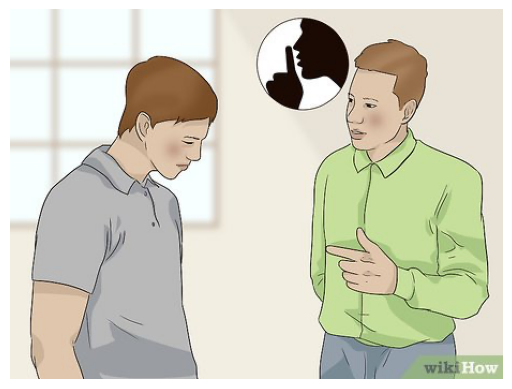

In [8]:
img = Image.open(image_path)

# Display the image
plt.imshow(img)
plt.axis('off')  # Hide the axis
plt.show()

In [9]:
{k: type(v) for k, v in meta.iloc[2].items()}

{'file_id': numpy.int64,
 'goal': str,
 'goal_description': str,
 'category_hierarchy': list,
 'methods': list}

In [10]:
{k: type(v) for k, v in meta.iloc[2]['methods'][0].items()}

{'name': str, 'steps': list, 'method_id': str}

In [11]:
{k: type(v) for k, v in meta.loc[2]['methods'][0]['steps'][0].items()}

{'headline': str,
 'description': str,
 'img': str,
 'img_license': str,
 'step_id': str}

In [12]:
print(meta.iloc[2]['goal'])
print(meta.iloc[2]['goal_description'])

How to Deal with Talkative Students
Delivering the day’s lesson to your class can be difficult if students won’t stop talking. Talking over them isn’t the best option, but there are ways to quiet your class. If 1 or 2 students are talking, you can redirect them or build correction into your lesson. If you have 1 student who often dominates discussion, get their help to boost classroom participation. Additionally, it’s important that you have policies in place to maintain a quiet classroom.


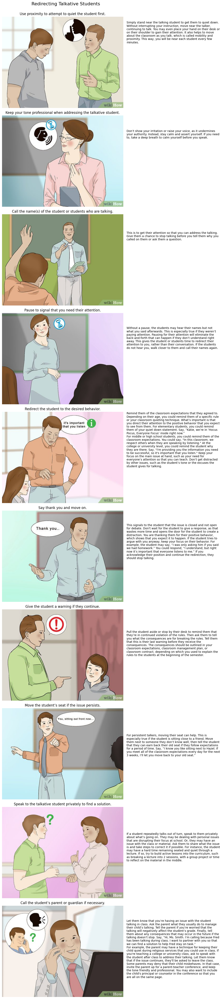

In [13]:
def display_method(method: dict):
    title = method['name']
    steps = method['steps']
    
    fig, axes = plt.subplots(len(steps), 1, figsize=(15, len(steps) * 5))
    fig.suptitle(title, fontsize=16)
    
    for i, (ax, step) in enumerate(zip(axes, steps)):
        image_path = str(TRAIN_IMAGES_PATH / step['step_id']) + ".png"
        if not os.path.exists(image_path):
            image_path = str(TEST_IMAGES_PATH / step['step_id']) + ".png"
        if not os.path.exists(image_path):
            raise FileNotFoundError(f"Image {step['step_id']}.png not found")
        img = Image.open(image_path)
        ax.imshow(img)
        ax.axis('off')
        ax.set_title(step['headline'], fontsize=12)
        
        fig.text(0.7, 1 - (i + 0.5) / len(steps), step['description'], fontsize=10, va='center', ha='left', wrap=True)
    
    # plt.tight_layout(rect=[0, 0, 0.85, 0.96])
    plt.tight_layout(rect=[0, 0, 0.98, 0.98])
    plt.show()

display_method(meta.iloc[2]['methods'][0])

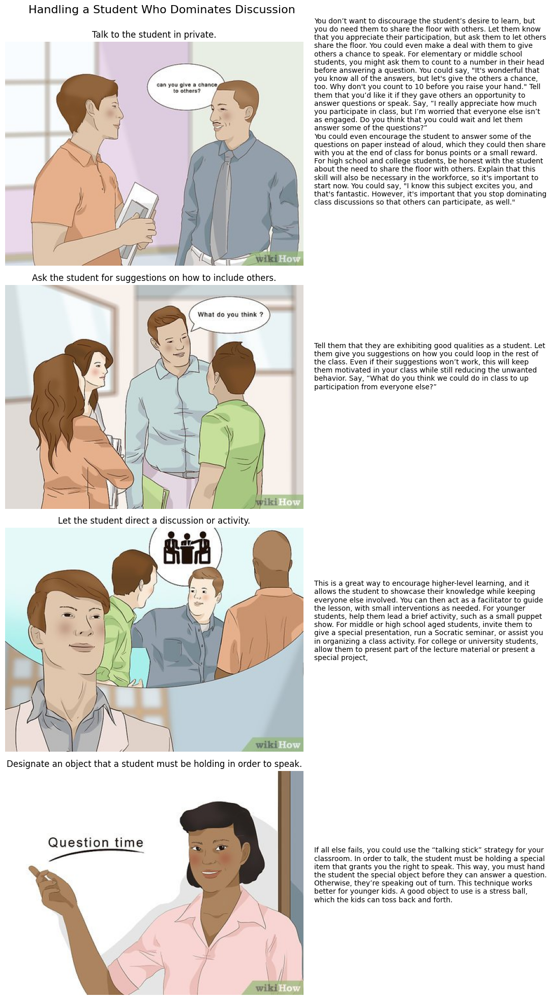

In [14]:
display_method(meta.iloc[2]['methods'][1])

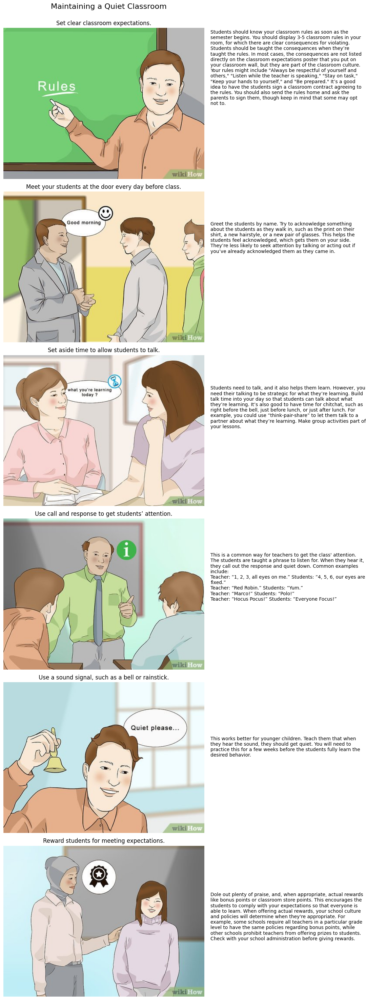

In [15]:
display_method(meta.iloc[2]['methods'][2])

In [16]:
len(meta.iloc[18]['methods'])

3

In [17]:
print(meta.iloc[18]['goal'])
print(meta.iloc[18]['goal_description'])

How to Deal with Attention Seeking Adults
Frequent dramatic displays, exaggerated stories, and over-the-top conflict are often the signs of an attention seeker. If someone is bothering you with these behaviors, the best thing to do is to ignore their antics. Strong personal boundaries can help you stay calm and in control. If the attention seeker is a loved one, however, you might want to see if you can help them overcome their behaviors with the assistance of a mental health professional.


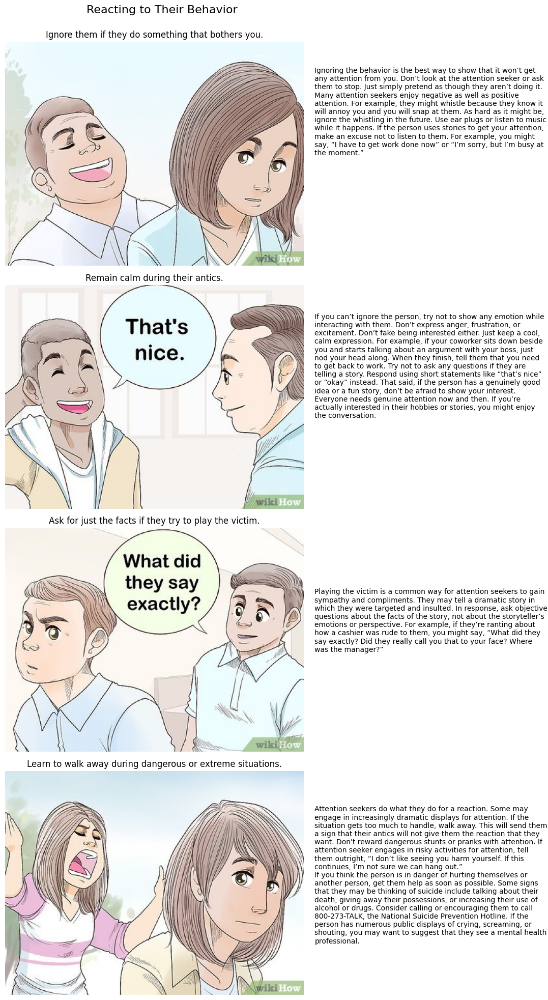

In [18]:
display_method(meta.iloc[18]['methods'][0])

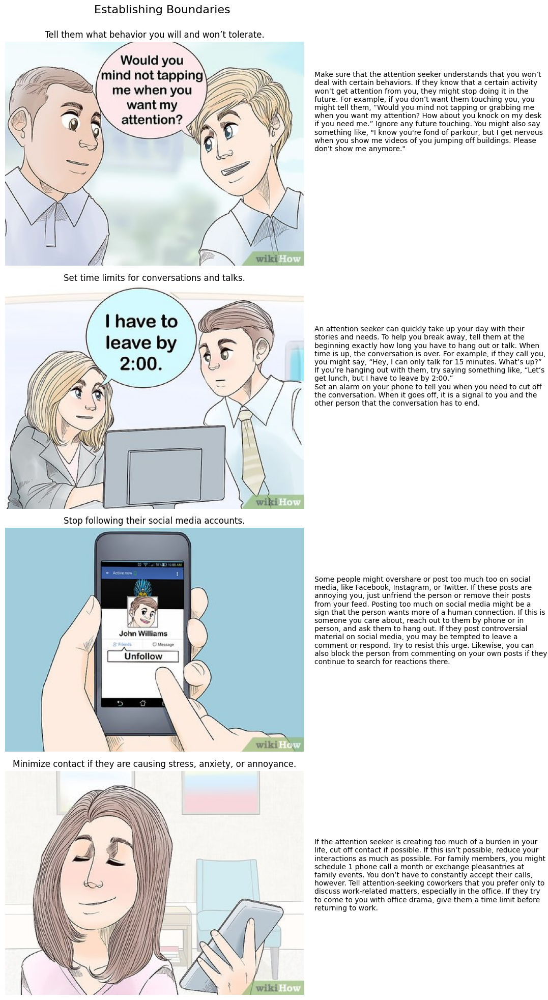

In [19]:
display_method(meta.iloc[18]['methods'][1])

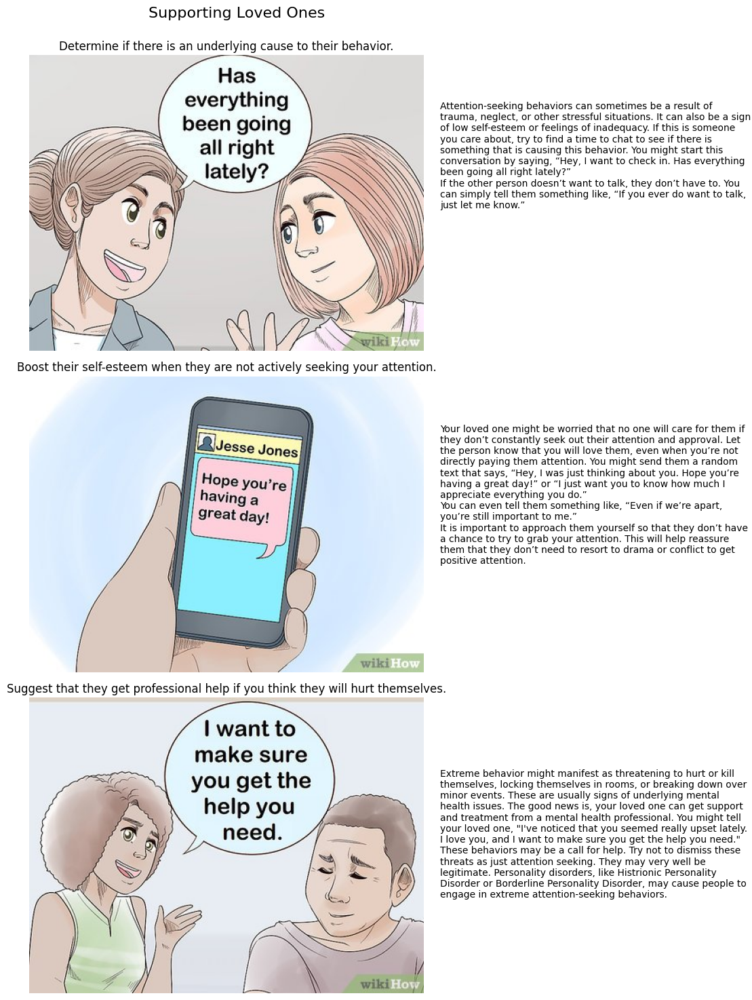

In [20]:
display_method(meta.iloc[18]['methods'][2])

In [21]:
print(meta.iloc[14].goal)
print(meta.iloc[14].goal_description)
print(len(meta.iloc[14].methods))

How to Add Facebook Like to WordPress
None
2


In [25]:
meta.iloc[14]['methods'][0]['steps']

[{'headline': 'Go to http://developers.facebook.com/docs/reference/plugins/like .',
  'description': '',
  'img': 'https://www.wikihow.com/images/thumb/e/e3/1000640-1.jpg/v4-459px-1000640-1.jpg',
  'img_license': 'Creative Commons',
  'step_id': '1000640_0_0'},
 {'headline': 'Choose your options.',
  'description': '',
  'img': 'https://www.wikihow.com/images/thumb/b/bd/1000640-2.jpg/v4-460px-1000640-2.jpg',
  'img_license': 'Creative Commons',
  'step_id': '1000640_0_1'},
 {'headline': 'After entering the URL of your blog, right-click the button and select "Open frame in new tab/window".',
  'description': '',
  'img': 'https://www.wikihow.com/images/3/33/1000640-3.jpg',
  'img_license': 'Creative Commons',
  'step_id': '1000640_0_2'},
 {'headline': 'Copy the URL that opens.',
  'description': 'You will need this later.',
  'img': 'https://www.wikihow.com/images/thumb/6/6b/1000640-4.jpg/v4-460px-1000640-4.jpg',
  'img_license': 'Creative Commons',
  'step_id': '1000640_0_3'}]

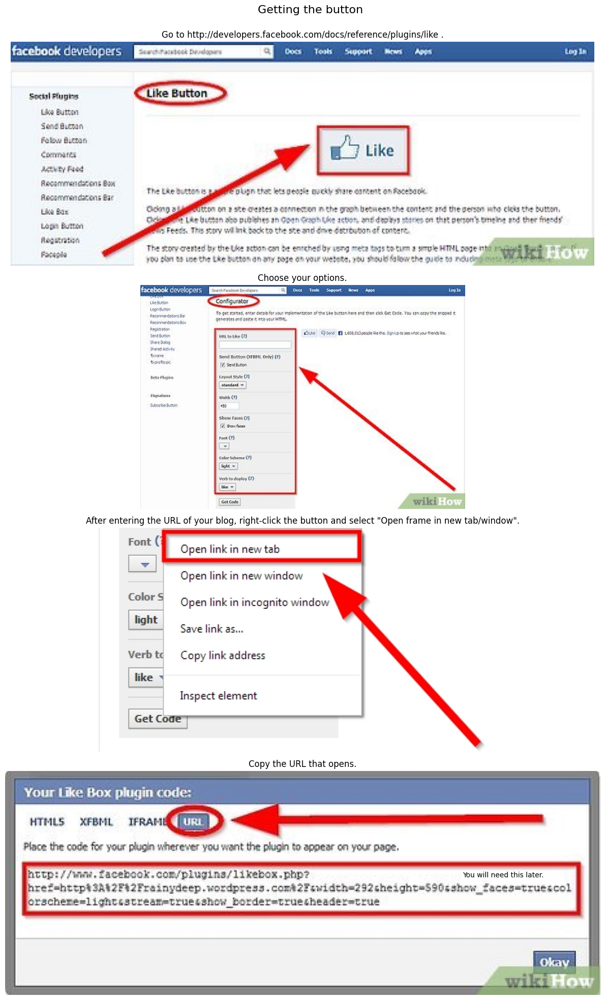

In [22]:
display_method(meta.iloc[14]['methods'][0])

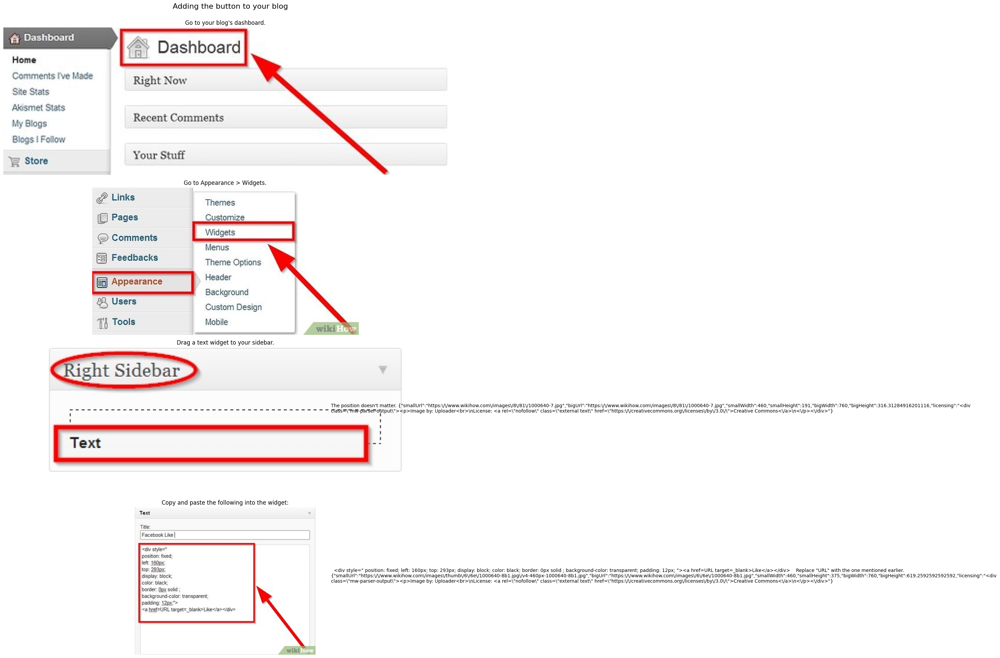

In [23]:
display_method(meta.iloc[14]['methods'][1])